In [1]:
import sys
!{sys.executable} -m pip install gensim
!{sys.executable} -m pip install sklearn
!{sys.executable} -m pip install matplotlib
!{sys.executable} -m pip install pandas
!{sys.executable} -m pip install xgboost
!{sys.executable} -m pip install graphviz

You should consider upgrading via the 'pip install --upgrade pip' command.
You should consider upgrading via the 'pip install --upgrade pip' command.
You should consider upgrading via the 'pip install --upgrade pip' command.
You should consider upgrading via the 'pip install --upgrade pip' command.
You should consider upgrading via the 'pip install --upgrade pip' command.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [2]:
%cd /home/opencog

/home/opencog


In [42]:
from opencog.atomspace import AtomSpace, types
from opencog.scheme_wrapper import scheme_eval
from opencog.type_constructors import *
from opencog.atomspace import get_refreshed_types, get_type, get_type_name

In [44]:
atomspace = AtomSpace()

In [46]:
#deps= "/home/opencog/opencog_deps"
#sample_dataset = "/opt/sample_dataset.scm"
deps= "opencog_deps"
sample_dataset = "sample_dataset.scm"

#load the opencog_deps file which has the modules necessary to make the pattern matching functions run
scheme_eval(atomspace, '(primitive-load "{}")'.format(deps))

b'\n'

In [48]:

#scheme_eval(atomspace, '(primitive-load "{}")'.format("smallgene/biogrid_gene_gene_3.5.177.scm"))
scheme_eval(atomspace, '(primitive-load "{}")'.format("smallgene/string_ggi.scm"))
scheme_eval(atomspace, '(primitive-load "{}")'.format("smallgene/GO.scm"))
scheme_eval(atomspace, '(primitive-load "{}")'.format("smallgene/Go-Plus.scm"))
scheme_eval(atomspace, '(primitive-load "{}")'.format("smallgene/GO_annotation.scm"))
scheme_eval(atomspace, '(primitive-load "{}")'.format("smallgene/NCBI2Reactome_PE_Pathway.txt2.scm"))
scheme_eval(atomspace, '(primitive-load "{}")'.format("smallgene/reactome.scm"))
scheme_eval(atomspace, '(primitive-load "{}")'.format("smallgene/smpdb_gene.scm"))


#verify the atoms are loaded

print("after datasets:" +scheme_eval(atomspace, "(count-all)").decode("utf-8"))

after datasets:3780914



In [50]:
#specify the default atomspace to use for running queries
set_default_atomspace(atomspace)

In [52]:
#we need to refresh the type dict so that it contains the newly added types [GeneNode, MoleculeNode]
types = get_refreshed_types()

In [54]:
import copy
def find_deepwalk_node_type(node): 
    deepwalk_node_type = None
    node_defs ={ 
            #take the first that begins with the string"
            "ConceptNode":[("R-HSA","rhsapathway"), ("SMP","smppathway"), ("GO:","geneontologyterm")],
            "PredicateNode":[("has_location","location")],
            "GeneNode":[("","gene")]
    }
    #print("node.type_name")
    #print(node.type_name)
    if (node.type_name in node_defs):
        prefix_list =copy.deepcopy(node_defs[node.type_name])
        found = False
        while not found and len(prefix_list)> 0:
            prefix_tuple = prefix_list.pop(0)
            #print ("prefix_tuple")
            #print (prefix_tuple)
            if prefix_tuple[0] == "" or node.name.startswith(prefix_tuple[0]):
                found == True
                deepwalk_node_type = prefix_tuple[1]
                
    return deepwalk_node_type

In [56]:
from opencog.bindlink import execute_atom

def construct_eval_set_query(predicate, node, other_type=None):
    '''
    Note: this function is returning the Evalutaion Links instead of the grounded node because 
    the links have the truth values
    '''
    if other_type is None:      
        bind_atom = \
            GetLink(
                VariableNode("$g"),
                EvaluationLink(
                    PredicateNode(predicate),
                    SetLink(
                        node,
                        VariableNode("$g")
                    )
                ), 
                 EvaluationLink(
                    PredicateNode(predicate),
                    SetLink(
                        node,
                        VariableNode("$g")
                    )
                )
            )
    else:
        bind_atom = \
            BindLink(
                TypedVariableLink(VariableNode("$g"), TypeNode(other_type)),
                EvaluationLink(
                    PredicateNode(predicate),
                    SetLink(
                        node,
                        VariableNode("$g")
                    )
                ), 
                EvaluationLink(
                    PredicateNode(predicate),
                    SetLink(
                        node,
                        VariableNode("$g")
                    )
                )
            )
        
    result = execute_atom(atomspace, bind_atom)
    #print(result)
    return result.out

In [58]:
from opencog.bindlink import execute_atom

def construct_eval_query(predicate, node, other_type=None):
    if other_type is None:      
        bind_atom = \
            BindLink(
                VariableNode("$g"),
                EvaluationLink(
                    PredicateNode(predicate),
                    ListLink(
                        node,
                        VariableNode("$g")
                    )
                ), 
                VariableNode("$g")
            )
    else:
        bind_atom = \
            BindLink(
                TypedVariableLink(VariableNode("$g"), TypeNode(other_type)),
                EvaluationLink(
                    PredicateNode(predicate),
                    ListLink(
                        node,
                        VariableNode("$g")
                    )
                ), 
                VariableNode("$g")
            )
        
    result = execute_atom(atomspace, bind_atom)
    return result.out


In [60]:
from opencog.bindlink import execute_atom
def construct_member_query(node):
    member_atom = \
        BindLink(VariableNode("$g"),
                 MemberLink(
                    node,
                    VariableNode("$g")
                 ),
                 VariableNode("$g")
                 )
    
    result = execute_atom(atomspace, member_atom)
    return result.out

In [62]:
from opencog.bindlink import execute_atom
def construct_inheritance_query(node):
    member_atom = \
        BindLink(VariableNode("$g"),
                 InheritanceLink(
                    node,
                    VariableNode("$g")
                 ),
                 VariableNode("$g")
                 )
    
    result = execute_atom(atomspace, member_atom)
    return result.out

In [64]:
from opencog.bindlink import execute_atom
def construct_subset_query(node):
    member_atom = \
        BindLink(VariableNode("$g"),
                 SubsetLink(
                    node,
                    VariableNode("$g")
                 ),
                 VariableNode("$g")
                 )
    
    result = execute_atom(atomspace, member_atom)
    return result.out

In [66]:
def construct_context_query(gene):
    query_atom = \
        BindLink(
            VariableList(
                TypedVariableLink(VariableNode("$p"), TypeNode("ConceptNode")),
                TypedVariableLink(VariableNode("$q"), TypeNode("ConceptNode"))
            ),
    
            ContextLink(
                
                MemberLink (
                    gene,
                    VariableNode ("$p")
                ),

                EvaluationLink (
                     PredicateNode ("has_location"),
                     ListLink(
                        gene,
                        VariableNode ("$q")
                     )
                )

            ),
       
        
            ListLink(
                VariableNode("$p"),
                VariableNode("$q")
            )
        )
    result = execute_atom(atomspace, query_atom)
    return result.out

In [68]:
linkset = {"inhibits", "is-inhibited-by", "ptmod", "is-ptmoded-by", "expresses","is-expressed-by", 
           "activates", "is-activated-by", "catalyzes", "is-catalyzed-by", "binds-with", "reacts-with", 
            "in-smp-pathway", "has-smp-pathway-member", "in-gene-ontology",
           "has-gene-ontology-member", 'is-in',  'in-context-of', 'is-context-where', 
           'has', "inherits-pathway", "pathway-inherited-by", 
           "inherits-geneontologyterm", "geneontologyterm-inherited-by", "positively-regulates",
           "is-positively-regulated-by", "negatively-regulates", "is-negatively-regulated-by",
           'has-variant','is-variant-of',"has-person-member", "is-person-member-of", 
           "superc-has-variant", "is-variant-of-superc",
           "normal-has-variant", "is-variant-of-normal"
          }
geneset = set()
rhsapathwayset = set()
smppathwayset= set()
geneontologytermset = set()
locationset = set()

for node in atomspace.get_atoms_by_type(types.Node):
    deepwalk_type = find_deepwalk_node_type(node)
    
    if deepwalk_type and deepwalk_type =="gene":
        geneset.add(node.name)
    if deepwalk_type and deepwalk_type =="rhsapathway":
        rhsapathwayset.add(node.name)
    if deepwalk_type and deepwalk_type =="smppathway":
        smppathwayset.add(node.name)
    if deepwalk_type and deepwalk_type =="geneontologyterm":
        geneontologytermset.add(node.name)
    if deepwalk_type and deepwalk_type =="location":
        locationset.add(node.name)
genelist = list(geneset)
print(len(genelist))
geneontologytermlist =list(geneontologytermset)
len(geneontologytermlist)

28275


44825

In [70]:
import pandas as pd

biomapdf = pd.read_csv("mosesDoseNoFeature2Gene.csv")
centdf = pd.read_csv("scV1kg26noDose.csv")
print(len(biomapdf))

genes=set(biomapdf['Name'])
print(len (genes))

intersection = genes.intersection(geneset)
print(len(intersection))

current_map =biomapdf[biomapdf['Name'].isin(intersection)]
print(len(current_map))

51877
1843
941
37846


In [71]:
phrases =set()
truth_values ={}
halfphrases = set()
proteinset = set()
for index, row in current_map.iterrows():
    phrases.add((row['Name'].strip(),'has-variant',row['feature'].strip()))
    halfphrases.add((row['Name'].strip(),'has-variant',row['feature'].strip()))
    phrases.add((row['feature'].strip(),'is-variant-of',row['Name'].strip()))
    proteinset.add(row['feature'].strip())


In [72]:
supercpersonset =set()
normalpersonset = set()
persontypeset = set()
persontypeset.add('normal')
persontypeset.add('superc')
isa_supercenturian =[]
for (columnName, columnData) in centdf.iteritems():
    if columnName== 'case':
        isa_supercenturian = columnData.values
    else:
        for index,has_expressed in enumerate(columnData.values):
            name =""
            if isa_supercenturian[index]==1:
                name = "superc"+str(index)
                phrases.add(("superc","has-person-member",name))
                halfphrases.add(("superc","has-person-member",name))
                phrases.add((name, "is-person-member-of", "superc"))
                supercpersonset.add(name)
                if has_expressed == 1:
                    phrases.add((name,"superc-has-variant",columnName.strip()))
                    halfphrases.add((name,"superc-has-variant",columnName.strip()))
                    phrases.add((columnName.strip(), "is-variant-of-superc", name))
            else:
                name = "normal"+str(index)
                phrases.add(("normal","has-person-member",name))
                halfphrases.add(("normal","has-person-member",name))
                phrases.add((name, "is-person-member-of", "normal"))
                normalpersonset.add(name)
                if has_expressed == 1:
                    phrases.add((name,"normal-has-variant",columnName.strip()))
                    halfphrases.add((name,"normal-has-variant",columnName.strip()))
                    phrases.add((columnName.strip(), "is-variant-of-normal", name))
supercpersonlist = list(supercpersonset)

In [73]:
def add_gene_triplet(node,name,verb,reverse):
    result3 = construct_eval_set_query(name, node, other_type='GeneNode')
    if result3:
        for evalLink in result3:
            tv = None
            if hasattr(evalLink,"tv"):
                strength = evalLink.tv.mean
                confidence = evalLink.tv.confidence
                tv = (strength,confidence)
                #print(tv)
            node2 = evalLink.out[1].out[0]
            deepwalk_type2=find_deepwalk_node_type(node2)
            #print(deepwalk_type2)
            if deepwalk_type2 =="gene":
                tup = (node.name.strip() ,verb, node2.name.strip() )
                reverse_tup = (node2.name.strip() ,reverse, node.name.strip() )
                if (node2.name.strip(),node.name.strip()) not in existingTuples:
                    halfphrases.add(tup)
                    existingTuples.add((node.name.strip(),node2.name.strip()))
                phrases.add(tup)
                phrases.add(reverse_tup)
                if tv is not None:
                    truth_values [tup]=tv
                    truth_values[reverse_tup]=tv


In [74]:
existingTuples = set()

for node in atomspace.get_atoms_by_type(types.Node):
    #print('node.name')
    #print(node.name)
    deepwalk_type = find_deepwalk_node_type(node)
    if deepwalk_type and deepwalk_type =="gene":
        result = construct_member_query(node)
        if result:
            for node2 in result:
                deepwalk_type2=find_deepwalk_node_type(node2)
                if deepwalk_type2 =="smppathway":
                    halfphrases.add((node.name.strip() ,"in-smp-pathway", node2.name.strip() ))
                    phrases.add((node.name.strip() ,"in-smp-pathway", node2.name.strip() ))
                    phrases.add((node2.name.strip() ,"has-smp-pathway-member", node.name.strip() ))
                elif deepwalk_type2 =="geneontologyterm":
                    halfphrases.add((node.name.strip() ,"in-gene-ontology", node2.name.strip() ))
                    phrases.add((node.name.strip() ,"in-gene-ontology", node2.name.strip() ))
                    phrases.add((node2.name.strip() ,"has-gene-ontology-member", node.name.strip() ))
        result2 = construct_context_query(node)
        if result2:
            for node2 in result2:
                halfphrases.add((node.name.strip(), 'is-in', node2.out[1].name.strip(), 'in-context-of', node2.out[0].name.strip()))
                
                phrases.add((node.name.strip(), 'is-in', node2.out[1].name.strip(), 'in-context-of', node2.out[0].name.strip()))
                phrases.add(( node2.out[0].name.strip(), 'is-context-where', node2.out[1].name.strip(), 'has', node.name.strip()))
       
        #result3 = construct_eval_query('interacts_with', node, other_type='GeneNode')
        add_gene_triplet(node,'inhibition','inhibits','is-inhibited-by')
        add_gene_triplet(node,'ptmod','ptmod','is-ptmoded-by')
        add_gene_triplet(node,'expression','expresses','is-expressed-by')
        add_gene_triplet(node,'activation','activates','is-activated-by')
        add_gene_triplet(node,'catalysis','catalyzes','is-catalyzed-by')
        add_gene_triplet(node,'binding','binds-with','binds-with')
        add_gene_triplet(node,'reaction','reacts-with','reacts-with')
    
    elif deepwalk_type and deepwalk_type =="rhsapathway":
        result10 = construct_inheritance_query(node)
        if result10:
            for node2 in result10:
                deepwalk_type2=find_deepwalk_node_type(node2)
                if deepwalk_type2 =="rhsapathway":
                    halfphrases.add((node.name.strip() ,"inherits-pathway", node2.name.strip() ))
                    
                    phrases.add((node.name.strip() ,"inherits-pathway", node2.name.strip() ))
                    phrases.add((node2.name.strip() ,"pathway-inherited-by", node.name.strip() ))
    elif deepwalk_type and deepwalk_type =="geneontologyterm":
        result11 = construct_inheritance_query(node)
        if result11:
            for node2 in result11:
                deepwalk_type2=find_deepwalk_node_type(node2)
                if deepwalk_type2 =="geneontologyterm":
                    halfphrases.add((node.name.strip() ,"inherits-geneontologyterm", node2.name.strip() ))
                    
                    phrases.add((node.name.strip() ,"inherits-geneontologyterm", node2.name.strip() ))
                    phrases.add((node2.name.strip() ,"geneontologyterm-inherited-by", node.name.strip() ))
        result12 = construct_eval_query('GO_positively_regulates', node, other_type='ConceptNode')
        if result12:
            for node2 in result12:
                deepwalk_type2=find_deepwalk_node_type(node2)
                if deepwalk_type2 =="geneontologyterm":
                    halfphrases.add((node.name.strip() ,"positively-regulates", node2.name.strip() ))
                    
                    phrases.add((node.name.strip() ,"positively-regulates", node2.name.strip() ))
                    phrases.add((node2.name.strip() ,"is-positively-regulated-by", node.name.strip() ))
        result13 = construct_eval_query('GO_negatively_regulates', node, other_type='ConceptNode')
        if result13:
            for node2 in result13:
                deepwalk_type2=find_deepwalk_node_type(node2)
                if deepwalk_type2 =="geneontologyterm":
                    halfphrases.add((node.name.strip() ,"negatively-regulates", node2.name.strip() ))
                    
                    phrases.add((node.name.strip() ,"negatively-regulates", node2.name.strip() ))
                    phrases.add((node2.name.strip() ,"is-negatively-regulated-by", node.name.strip() ))

In [75]:
includedNodesSet = set()
includedRelationsSet=set()
includedTripletsSet= set()
for tup in halfphrases:
    if len(tup)> 1:
        includedNodesSet.add(tup[0])
        includedRelationsSet.add(tup[1])
        includedNodesSet.add(tup[2])
    if len(tup)> 3:
        includedRelationsSet.add(tup[3])
        includedNodesSet.add(tup[4])
    if len(tup)== 3:
        includedTripletsSet.add(tup)
    elif len(tup)==5:
        splittup = tuple([tup[0],tup[1],tup[2]])
        includedTripletsSet.add(splittup)
        splittup = tuple([tup[2],tup[3],tup[4]])
        includedTripletsSet.add(splittup)
        

In [76]:
percent_test=10
percent_valid=10
num_test = int(len(phrases) * 0.01 * percent_test)
num_valid_and_test = int(len(phrases) * 0.01 * percent_valid) + num_test

file = open("entities.dict","w") 
for i,node in enumerate(includedNodesSet):
    file.write("{0}\t{1}\n".format(i,node)) 
file.close() 
 
file = open("relations.dict","w") 
for i,rel in enumerate(includedRelationsSet):
    file.write("{0}\t{1}\n".format(i,rel)) 
file.close() 

file1 = open("test.txt","w") 
file2 = open("valid.txt","w") 
file3 = open("train.txt","w") 
for i,t in enumerate(includedTripletsSet):
    if i < num_test:
        file1.write("{0}\t{1}\t{2}\n".format(t[0],t[1],t[2])) 
    elif i < num_valid_and_test:
        file2.write("{0}\t{1}\t{2}\n".format(t[0],t[1],t[2])) 
    else:
        file3.write("{0}\t{1}\t{2}\n".format(t[0],t[1],t[2])) 
    
file1.close()
file2.close()    
file3.close() 

In [77]:
len(phrases)

6137652

In [78]:
phrases

{('normal307', 'normal-has-variant', 'X:53713590_T/C'),
 ('CRLS1', 'in-gene-ontology', 'GO:0036148'),
 ('GPD1', 'in-smp-pathway', 'SMP0021645'),
 ('H2A2C', 'binds-with', 'H2AZ'),
 ('normal348', 'normal-has-variant', '2:39009887_C/T'),
 ('GO:0019336', 'geneontologyterm-inherited-by', 'GO:0042429'),
 ('GO:0003684', 'has-gene-ontology-member', 'ERCC3'),
 ('CDS2', 'in-smp-pathway', 'SMP0048069'),
 ('X:48672067_G/A', 'is-variant-of-normal', 'normal386'),
 ('X:55169677_G/C', 'is-variant-of-normal', 'normal356'),
 ('DLL1', 'reacts-with', 'NOTC2'),
 ('PRS8', 'binds-with', 'PSMD7'),
 ('normal361', 'normal-has-variant', '17:41845451_G/A'),
 ('normal215', 'normal-has-variant', 'X:119514531_A/T'),
 ('PGS1', 'in-smp-pathway', 'SMP0057026'),
 ('3:158320597_T/C', 'is-variant-of-normal', 'normal33'),
 ('8:120779258_G/A', 'is-variant-of-normal', 'normal458'),
 ('GO:0005829', 'has-gene-ontology-member', 'LGALS4'),
 ('normal462', 'normal-has-variant', '19:48711789_T/G'),
 ('GPD1', 'in-smp-pathway', 'SMP0

In [79]:
phraselist = list(phrases)

In [80]:
#for p in phraselist:
    #print(p)

In [81]:
import pickle
try:
    with open("dict51.p", "rb") as f:
            normalized = pickle.load(f)
except Exception:
    dict1={}
    for tup in phrases:
        tv = truth_values[tup] if tup in truth_values else None
        if len(tup)>1:
            tup0 = tuple([tup[0]])
            if tup0 not in dict1:
                dict1[tup0]= set()
            dict1[tup0].add((("",tup[1]),1))
        if len(tup)>2:
            if (tup[0],tup[1]) not in dict1:
                dict1[(tup[0],tup[1])]= set()
            confidence = tv[1] if tv is not None else 1
            strength = "weakly" if tv is not None and tv[0]<0.25 else "moderately" if tv is not None and tv[0]<0.5 else ""
            dict1[(tup[0],tup[1])].add(((strength,tup[2]),confidence))
        if len(tup)>3:
            if (tup[0],tup[1],tup[2]) not in dict1:
                dict1[(tup[0],tup[1],tup[2])]= set()
            dict1[(tup[0],tup[1],tup[2])].add((("",tup[3]),1))
        if len(tup)>4:
            if (tup[0],tup[1],tup[2],tup[3]) not in dict1:
                dict1[(tup[0],tup[1],tup[2],tup[3]) ]= set()
            dict1[(tup[0],tup[1],tup[2],tup[3]) ].add((("",tup[4]),1))
    #print(dict1)
    normalized ={}
    for key, aset in dict1.items():
        numerator = sum([tup[1] for tup in aset])
        next_word_list = [(tup[0],int(tup[1])/numerator)for tup in aset  ]
        normalized[key]= next_word_list
    with open("dict51.p", "wb") as f:
        pickle.dump(normalized, f)


In [82]:
def roulette_wheel(tup_list):
    #given the present items in the phrase, give the next
    #works for 2 word phrases
    rand = random.random()
    summ = 0
    count =0
    chosen_tup = None
    #print(len(tup_list))
    while count < len(tup_list) and summ < rand:
        summ += tup_list[count][1]
        #print (summ)
        count += 1
    else: 
        chosen_tup = tup_list[count-1][0]
    #print(chosen_tup)
    return chosen_tup

In [86]:
import random
def make_sentences(first_word_list):
    try:
        with open("sentences51.p", "rb") as f:
                sentences = pickle.load(f)
    except Exception:
        num_sentences=10000000
        phrases_per_sentence = 10
        sentences = []
        for i in range(num_sentences):
            sentence = []
            for j in range(phrases_per_sentence):
                phrase =[]
                finished = False
                while not finished:
                    if len(sentence)==0:
                        word = random.choice(first_word_list)
                        phrase.append(word)
                        sentence.append(word)
                    elif len(phrase)== 0:
                        tup0 =tuple([sentence[-1]]) 
                        phrase.append(sentence[-1])
                        if tup0 in  normalized:
                            w1,w2 =roulette_wheel(normalized[tup0])
                            if not w1 == "":
                                phrase.append(w1)
                                sentence.append(w1)
                            phrase.append(w2)
                            sentence.append(w2)
                    elif tuple(phrase)  in normalized:
                        w1,w2 =roulette_wheel(normalized[tuple(phrase)])
                        if not w1 == "":
                            phrase.append(w1)
                            sentence.append(w1)
                        phrase.append(w2)
                        sentence.append(w2)
                    else:
                        finished = True
            sentences.append(sentence)
            if i % 10000 ==0:
                print (len(sentences))
        with open("sentences51.p", "wb") as f:
                pickle.dump(sentences, f)
    return (sentences)

In [87]:
#sentences = make_sentences(supercpersonlist)
sentences = make_sentences(geneontologytermlist)

In [88]:
for i in range(100):
        print (sentences[i])

['GO:0048061', 'inherits-geneontologyterm', 'GO:0042332', 'inherits-geneontologyterm', 'GO:0009629', 'geneontologyterm-inherited-by', 'GO:0071258', 'inherits-geneontologyterm', 'GO:0009629', 'has-gene-ontology-member', 'MSTN', 'in-gene-ontology', 'GO:0005737', 'inherits-geneontologyterm', 'GO:0110165', 'geneontologyterm-inherited-by', 'GO:1990916', 'inherits-geneontologyterm', 'GO:0110165', 'inherits-geneontologyterm', 'GO:0005575']
['GO:0043129', 'inherits-geneontologyterm', 'GO:0048875', 'inherits-geneontologyterm', 'GO:0048878', 'has-gene-ontology-member', 'POU3F3', 'in-gene-ontology', 'GO:0071837', 'has-gene-ontology-member', 'JUN', 'inhibits', 'CDK14', 'reacts-with', 'CLIP4', 'in-gene-ontology', 'GO:0005515', 'inherits-geneontologyterm', 'GO:0005488', 'geneontologyterm-inherited-by', 'GO:1904493']
['GO:0019680', 'inherits-geneontologyterm', 'GO:0071616', 'geneontologyterm-inherited-by', 'GO:0046949', 'has-gene-ontology-member', 'HTD2', 'binds-with', 'ACSL1', 'is-in', 'endoplasmic 

In [89]:
import gensim
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import os.path

plt.rcParams['figure.figsize'] = [100, 50]
# train model

if os.path.exists('model51.bin'):
    model = Word2Vec.load('model51.bin')
else:
    model = Word2Vec(sentences, min_count=1)
    model.save('model51.bin')
        
# summarize the loaded model
print(model)
# summarize vocabulary
words = list(model.wv.vocab)
print(words)

Word2Vec(vocab=108469, size=100, alpha=0.025)
['GO:0048061', 'inherits-geneontologyterm', 'GO:0042332', 'GO:0009629', 'geneontologyterm-inherited-by', 'GO:0071258', 'has-gene-ontology-member', 'MSTN', 'in-gene-ontology', 'GO:0005737', 'GO:0110165', 'GO:1990916', 'GO:0005575', 'GO:0043129', 'GO:0048875', 'GO:0048878', 'POU3F3', 'GO:0071837', 'JUN', 'inhibits', 'CDK14', 'reacts-with', 'CLIP4', 'GO:0005515', 'GO:0005488', 'GO:1904493', 'GO:0019680', 'GO:0071616', 'GO:0046949', 'HTD2', 'binds-with', 'ACSL1', 'is-in', 'endoplasmic reticulum membrane', 'in-context-of', 'R-HSA-2046105', 'inherits-pathway', 'R-HSA-2046104', 'R-HSA-8978868', 'R-HSA-556833', 'pathway-inherited-by', 'R-HSA-8848584', 'GO:0009178', 'GO:0009176', 'GO:0009177', 'GO:0046079', 'GO:0009223', 'NT5M', 'GO:0006244', 'GO:0006220', 'GO:0060888', 'GO:0003002', 'GO:0035282', 'GO:0007389', 'GO:0032501', 'GO:0030588', 'is-positively-regulated-by', 'GO:0051240', 'GO:0032340', 'GO:0046887', 'GO:0010595', 'positively-regulates', 'G

In [90]:
colors= ['red','green','blue','purple','yellow','orange','cyan','magenta','pink','black']
labels =[]
for word in words:
    if word in geneset:
        labels.append(0)
    elif word in rhsapathwayset:
        labels.append(1)
    elif word in smppathwayset:
        labels.append(2)
    elif word in geneontologytermset:
        labels.append(3)
    elif word in locationset:
        labels.append(4)
    elif word in supercpersonset:
        labels.append(5)
    elif word in normalpersonset:
        labels.append(6)
    elif word in proteinset:
        labels.append(7)
    elif word in linkset:
        labels.append(8)
    else: #persontypeset
        labels.append(9)

In [91]:

# access vector for one word
print(model["KNL1"])

[ 0.50894976  0.35975695 -0.33051586 -1.0239764   2.2013214  -0.4060251
 -0.586192    0.23253666 -0.08535258  0.8101133   0.6939576   1.427373
 -0.40503153  0.47402316  0.36101943 -0.51116455 -0.72159564 -1.2488221
 -0.22323833 -0.25559995 -0.33902386  0.30301595  0.6390893  -0.763579
  0.6109614   0.7193957   0.238146    0.62634486  1.6198726  -0.9055593
  1.5574818   0.21085541  0.10195211 -0.93292916  0.04854434  1.2382903
  0.06325468 -0.8826261  -0.77894443 -0.08859465 -0.2289719   0.43578398
  0.22453447 -1.0224813   0.9593293  -0.37910303  0.7012508  -0.5569731
  0.25474542 -0.37201354 -0.16278057 -0.29261708  0.12588303  0.2583134
  0.6327853  -0.2284622  -0.57433665 -0.00364841 -0.49005216  0.7087762
  0.5717497  -0.6898665  -0.19713207  0.30103847 -0.7728062  -0.05096748
 -0.2588204   0.47403508 -0.3709131  -0.52715135 -0.47248417 -0.28996888
  0.9266214  -1.0082022  -0.66319865  0.18514581  1.2612975   0.43665463
 -0.04580551 -0.1432732  -0.37073287  1.7864894  -0.07476873  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


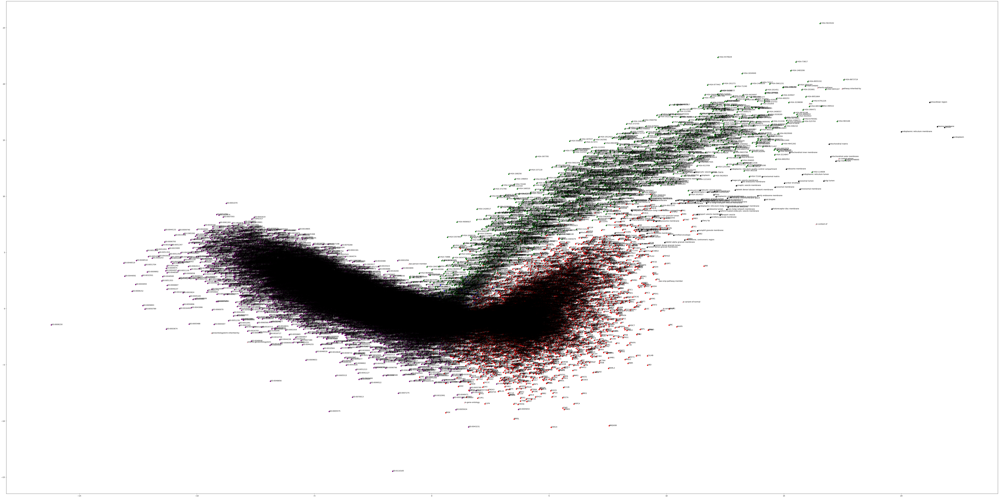

In [92]:
import matplotlib
# fit a 2d PCA model to the vectors
X = model[model.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# create a scatter plot of the projection
plt.scatter(result[:, 0], result[:, 1],c=labels, cmap=matplotlib.colors.ListedColormap(colors))
words = list(model.wv.vocab)
for i, word in enumerate(words):
    plt.annotate(word, xy=(result[i, 0], result[i, 1]))
plt.show()

In [93]:
model.most_similar("cytosol")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('ciliary base', 0.794280469417572),
 ('mitochondrial outer membrane', 0.7914822101593018),
 ('cytoplasmic vesicle membrane', 0.7796202898025513),
 ('Golgi-associated vesicle membrane', 0.775873064994812),
 ('endosome membrane', 0.7752463817596436),
 ('clathrin-sculpted gamma-aminobutyric acid transport vesicle membrane',
  0.7737021446228027),
 ('lipid droplet', 0.7723084688186646),
 ('extracellular exosome', 0.7715323567390442),
 ('endosome lumen', 0.7705973386764526),
 ('early endosome', 0.7677353620529175)]

In [94]:
model.most_similar(positive=['superc'], negative=['normal'])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('superc5', 0.4154619574546814),
 ('is-variant-of-superc', 0.4059164524078369),
 ('1:2486172_T/C', 0.3882530927658081),
 ('17:40854142_C/T', 0.3789594769477844),
 ('22:19438362_A/G', 0.372270405292511),
 ('19:53570121_C/T', 0.36605218052864075),
 ('superc10', 0.36491936445236206),
 ('superc-has-variant', 0.3643457889556885),
 ('12:32485918_A/T', 0.3581754267215729),
 ('9:97845718_A/G', 0.35193097591400146)]

In [95]:
model.most_similar("superc")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('superc10', 0.691868782043457),
 ('superc6', 0.6912930011749268),
 ('superc0', 0.6836195588111877),
 ('superc19', 0.6733776330947876),
 ('superc21', 0.6728597283363342),
 ('superc25', 0.6697912812232971),
 ('superc23', 0.6690322756767273),
 ('superc13', 0.6676203012466431),
 ('superc17', 0.6621742248535156),
 ('superc24', 0.6581104397773743)]

In [96]:
#+b cell differentiation, -t cell differentiation,+ t cell proliferation
model.most_similar(positive=['GO:0030183','GO:0042098'], negative=['GO:0030217'])
#first one should be GO:0042100, b cell proliferation

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  


[('GO:0042100', 0.6795783042907715),
 ('GO:0042113', 0.6406548023223877),
 ('GO:0046651', 0.6197350025177002),
 ('GO:0030101', 0.6191891431808472),
 ('GO:0001787', 0.6167716979980469),
 ('GO:0050798', 0.6157997846603394),
 ('GO:0030890', 0.5985020399093628),
 ('GO:0042104', 0.5891885161399841),
 ('GO:0030889', 0.5821648836135864),
 ('GO:0046649', 0.5578752160072327)]

In [97]:
#+nucleus, +mitochondrial genome maintenence,-mitochondria
model.most_similar(positive=['GO:0005634','GO:0005739'], negative=['GO:0000002'])
#first one should be GO:0051276, nuclear genome maintenence

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  


[('GO:0005654', 0.5715329647064209),
 ('GO:0005829', 0.5275306701660156),
 ('GO:0005737', 0.5204803943634033),
 ('GO:0001650', 0.5146776437759399),
 ('GO:0016363', 0.4787754714488983),
 ('5:175815535_G/A', 0.47268712520599365),
 ('GO:0005730', 0.46640560030937195),
 ('GO:0016607', 0.4603338837623596),
 ('GO:0031625', 0.4520900845527649),
 ('MAK16', 0.4448297619819641)]

In [98]:
#+nucleus, +mitochondrial genome maintenence,-mitochondria
model.most_similar(positive=['GO:0005634','GO:0000002'], negative=['GO:0005739'])
#first one should be GO:0051276, nuclear genome maintenence

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  


[('GO:0000981', 0.5550377368927002),
 ('GO:0001227', 0.534753680229187),
 ('GO:0033955', 0.5325194001197815),
 ('GO:0001228', 0.5297222137451172),
 ('GO:0043565', 0.5179905891418457),
 ('GO:0000978', 0.5105198621749878),
 ('GO:0043504', 0.4973060190677643),
 ('GO:0000790', 0.4946638345718384),
 ('GO:0001673', 0.4940008521080017),
 ('GO:0044030', 0.48102718591690063)]

In [99]:
#+nuclear transcription factor complex, +mitochondrial genome maintenence,-mitochondrian transcription
model.most_similar(positive=['GO:0044798','GO:0000002'], negative=['GO:0006390'])
#first one should be GO:0051276, nuclear genome maintenence

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  


[('GO:0000121', 0.48797479271888733),
 ('GO:0043136', 0.4787615239620209),
 ('GO:0008967', 0.4673026204109192),
 ('GO:0052834', 0.4598369002342224),
 ('GO:0003170', 0.44782671332359314),
 ('GO:0008252', 0.44276922941207886),
 ('GO:0033955', 0.44117558002471924),
 ('GO:0102757', 0.44079622626304626),
 ('GO:0052832', 0.4402230381965637),
 ('GO:0090575', 0.43938010931015015)]

In [100]:
genemembers = {}
for sentence in phrases:
    if sentence[1]=='has-gene-ontology-member':
        if sentence[0] not in genemembers:
            genemembers[sentence[0]] = set()
        genemembers[sentence[0]].add(sentence[2])


In [101]:
gomembers = {}
for sentence in phrases:
    if sentence[1]=='geneontologyterm-inherited-by':
        if sentence[0] not in gomembers:
            gomembers[sentence[0]] = set()
        gomembers[sentence[0]].add(sentence[2])


In [102]:
import pandas as pd
infodf = pd.read_csv("agingGOterms.csv")

In [103]:
aging_goterms= list(infodf["GOID"])

In [104]:
aging_goterms

['GO:0001300',
 'GO:0001301',
 'GO:0001302',
 'GO:0001303',
 'GO:0001304',
 'GO:0001305',
 'GO:0001307',
 'GO:0001308',
 'GO:0001310',
 'GO:0001311',
 'GO:0001312',
 'GO:0001313',
 'GO:0001314',
 'GO:0001316',
 'GO:0001317',
 'GO:0001318',
 'GO:0001319',
 'GO:0001320',
 'GO:0001321',
 'GO:0001322',
 'GO:0001323',
 'GO:0001324',
 'GO:0006323',
 'GO:0007568',
 'GO:0007569',
 'GO:0007580',
 'GO:0010259',
 'GO:0010978',
 'GO:0019072',
 'GO:0019073',
 'GO:0019074',
 'GO:0034652',
 'GO:0035177',
 'GO:0036385',
 'GO:0036386',
 'GO:0039631',
 'GO:0039632',
 'GO:0044815',
 'GO:0060756',
 'GO:0060757',
 'GO:0060758',
 'GO:0061434',
 'GO:0090139',
 'GO:0090342',
 'GO:0090343',
 'GO:0090344',
 'GO:0098006',
 'GO:0098035',
 'GO:0098036',
 'GO:0098037',
 'GO:1900007',
 'GO:1900008',
 'GO:1900009',
 'GO:1900062',
 'GO:1900160',
 'GO:1903368',
 'GO:1903369',
 'GO:1903370',
 'GO:1905137',
 'GO:1905138']

In [105]:
#each gene onotlogy term as measured by the genes

def compute_simularity_ratios(genemembers):
    num_first =0
    top_ten = 0
    total =0
    num_first_aging=0
    top_ten_aging=0
    total_aging=0

    for ontology_term, gene_children in genemembers.items() :
        children = list(gene_children)
        if all(gene in model.wv.vocab for gene in children):
            simlist = model.most_similar(positive=children)
            if len (simlist) >0:
                total +=1
                if ontology_term in aging_goterms:
                    total_aging +=1
                if simlist[0][0]==ontology_term:
                    num_first += 1
                    if ontology_term in aging_goterms:
                        num_first_aging +=1
                is_in_top_ten = False
                for tup in simlist:
                    if tup[0]==ontology_term:
                        is_in_top_ten = True 
                if is_in_top_ten:
                    if ontology_term in aging_goterms:
                        top_ten_aging +=1
                    top_ten += 1

                    
    ratio_in_top_ten= top_ten/total if total !=0 else 0
    ratio_first= num_first/total if total !=0 else 0
    ratio_in_top_ten_aging= top_ten_aging/total_aging if total_aging !=0 else 0
    ratio_first_aging= num_first_aging/total_aging if total_aging !=0 else 0
    return (ratio_first,ratio_in_top_ten,ratio_first_aging,ratio_in_top_ten_aging)

In [106]:
ratio_first, ratio_in_top_ten ,ratio_first_aging, ratio_in_top_ten_aging = compute_simularity_ratios(genemembers)
print ("Ratio of gene ontology terms that are closest to sum of gene children is {0}".format(ratio_first))
print ("Ratio of gene ontology terms that are top ten closest to sum of gene children is {0}".format(ratio_in_top_ten))
print ("Ratio of aging gene ontology terms that are closest to sum of gene children is {0}".format(ratio_first_aging))
print ("Ratio of aging gene ontology terms that are top ten closest to sum of gene children is {0}".format(ratio_in_top_ten_aging))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  


Ratio of gene ontology terms that are closest to sum of gene children is 0.0809312029868775
Ratio of gene ontology terms that are top ten closest to sum of gene children is 0.28254543457969583
Ratio of aging gene ontology terms that are closest to sum of gene children is 0.1
Ratio of aging gene ontology terms that are top ten closest to sum of gene children is 0.2


In [107]:
#each gene onotlogy term as measured by child ontology terms
ratio_first1, ratio_in_top_ten1 ,ratio_first_aging1, ratio_in_top_ten_aging1 = compute_simularity_ratios(gomembers)
print ("Ratio of gene ontology terms that are closest to sum of gene ontology term children is {0}".format(ratio_first1))
print ("Ratio of gene ontology terms that are top ten closest to sum of gene ontology term children is {0}".format(ratio_in_top_ten1))
print ("Ratio of aging gene ontology terms that are closest to sum of gene ontology term children is {0}".format(ratio_first_aging1))
print ("Ratio of aging gene ontology terms that are top ten closest to sum of gene ontology term children is {0}".format(ratio_in_top_ten_aging1))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  


Ratio of gene ontology terms that are closest to sum of gene ontology term children is 0.6259705643759416
Ratio of gene ontology terms that are top ten closest to sum of gene ontology term children is 0.9484876578977866
Ratio of aging gene ontology terms that are closest to sum of gene ontology term children is 0.6153846153846154
Ratio of aging gene ontology terms that are top ten closest to sum of gene ontology term children is 0.9615384615384616


In [108]:
len (model.wv.vocab)

108469

In [109]:
model.most_similar(positive=supercpersonlist)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('19:53571917_G/A', 0.7247700691223145),
 ('11:73591624_C/T', 0.7076170444488525),
 ('normal461', 0.7048280239105225),
 ('9:134371502_T/G', 0.7034487724304199),
 ('12:133236415_T/C', 0.7026220560073853),
 ('3:16305937_C/T', 0.7015142440795898),
 ('2:85838201_A/T', 0.699491560459137),
 ('6:3264487_T/C', 0.6896853446960449),
 ('1:207247756_A/G', 0.6892642974853516),
 ('normal247', 0.688880205154419)]

In [110]:
model.most_similar("inhibits")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('is-inhibited-by', 0.9577119946479797),
 ('ptmod', 0.9197412729263306),
 ('activates', 0.8900549411773682),
 ('is-ptmoded-by', 0.8744683265686035),
 ('is-activated-by', 0.8663719892501831),
 ('reacts-with', 0.8127313256263733),
 ('binds-with', 0.7971071004867554),
 ('DUSTY', 0.6075637340545654),
 ('PK3CD', 0.5998506546020508),
 ('M3K7', 0.5921471118927002)]